# Introduction

We downloaded the dataset from Kaggle. This dataset contains information about almost all terrorism activities from 1970 to 2017 around the world.
(Link: https://www.kaggle.com/START-UMD/gtd)

The purpose of this project is to understand the characteristics or patterns of global terrorism and present them through various data visualization. We conducted the following analysis:

- time trend of the terrorists attacks over the world and top terrorism countries ？？
- identify the most attacked countries and the most active terrorist groups
- df


We used logistic regression, Random Forest and SVM models to predict the chances of success for a potential terrorist attack.




# Data preprocessing

## Data clean

In [1]:
import numpy as np
import pandas as pd

In [2]:
# read raw data
datafile = "data.csv"
raw_data = pd.read_csv(datafile, sep=',', engine='python')

In [17]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 135 entries, eventid to related
dtypes: float64(55), int64(22), object(58)
memory usage: 187.1+ MB


In [3]:
df = raw_data[['eventid', 'iyear', 'imonth', 'iday', 'extended', 'country',
       'country_txt', 'region', 'region_txt', 'motive', 'provstate', 'city', 'latitude',
       'longitude', 'specificity', 'vicinity', 'success', 'suicide',
       'attacktype1', 'attacktype1_txt', 'targtype1', 'targtype1_txt',
       'targsubtype1', 'targsubtype1_txt', 'target1', 'natlty1', 'natlty1_txt',
       'gname', 'guncertain1', 'weaptype1', 'weaptype1_txt', 'weapsubtype1',
       'weapsubtype1_txt', 'nkill', 'nwound', 'ishostkid', 'dbsource',
       'INT_LOG', 'INT_IDEO', 'INT_MISC', 'INT_ANY', 'individual']]

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 42 columns):
eventid             181691 non-null int64
iyear               181691 non-null int64
imonth              181691 non-null int64
iday                181691 non-null int64
extended            181691 non-null int64
country             181691 non-null int64
country_txt         181691 non-null object
region              181691 non-null int64
region_txt          181691 non-null object
motive              50561 non-null object
provstate           181270 non-null object
city                181257 non-null object
latitude            177135 non-null float64
longitude           177134 non-null float64
specificity         181685 non-null float64
vicinity            181691 non-null int64
success             181691 non-null int64
suicide             181691 non-null int64
attacktype1         181691 non-null int64
attacktype1_txt     181691 non-null object
targtype1           181691 non-null in

In [4]:
# drop null records
df = df.dropna(axis=0,how='all')

# drop nonsense date rows
df = df[df['iday']>=1]
df = df[df['iday']<=31]
df = df[df['imonth']<=12]
df = df[df['imonth']>=1]

# drop unclear unknown weapon type, unknown attack type, unknown target type
df = df[df['weaptype1']!=13]
df = df[df['targtype1']!=20]
df = df[df['attacktype1']!=9]

In [5]:
# the remaning proportion
len(df), len(df) / len(raw_data)

(160168, 0.8815406376760544)

## Data reprensentation

### columns illustration

In [7]:
df.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'extended', 'country',
       'country_txt', 'region', 'region_txt', 'motive', 'provstate', 'city',
       'latitude', 'longitude', 'specificity', 'vicinity', 'success',
       'suicide', 'attacktype1', 'attacktype1_txt', 'targtype1',
       'targtype1_txt', 'targsubtype1', 'targsubtype1_txt', 'target1',
       'natlty1', 'natlty1_txt', 'gname', 'guncertain1', 'weaptype1',
       'weaptype1_txt', 'weapsubtype1', 'weapsubtype1_txt', 'nkill', 'nwound',
       'ishostkid', 'dbsource', 'INT_LOG', 'INT_IDEO', 'INT_MISC', 'INT_ANY',
       'individual'],
      dtype='object')

### category illustration

In [7]:
df['weaptype1_txt'].unique()

array(['Firearms', 'Explosives', 'Incendiary', 'Chemical', 'Melee',
       'Sabotage Equipment',
       'Vehicle (not to include vehicle-borne explosives, i.e., car or truck bombs)',
       'Fake Weapons', 'Radiological', 'Other', 'Biological'],
      dtype=object)

In [8]:
df['attacktype1_txt'].unique()

array(['Armed Assault', 'Assassination', 'Bombing/Explosion',
       'Facility/Infrastructure Attack', 'Hijacking',
       'Hostage Taking (Kidnapping)', 'Unarmed Assault',
       'Hostage Taking (Barricade Incident)'], dtype=object)

In [9]:
df['targtype1_txt'].unique()

array(['Police', 'Utilities', 'Military', 'Government (General)',
       'Airports & Aircraft', 'Business', 'Educational Institution',
       'Violent Political Party', 'Government (Diplomatic)',
       'Private Citizens & Property', 'Religious Figures/Institutions',
       'Transportation', 'Tourists', 'NGO', 'Telecommunication',
       'Food or Water Supply', 'Terrorists/Non-State Militia', 'Other',
       'Journalists & Media', 'Maritime', 'Abortion Related'],
      dtype=object)

In [10]:
df['gname'].unique()

array(['Black Nationalists', 'Tupamaros (Uruguay)', 'Unknown', ...,
       'Fatoni Warriors', 'Minorities of Metropolitan Attacks',
       'Baloch Republican Party'], dtype=object)

In [22]:
df['motive'].unique()

array(['To protest the Cairo Illinois Police Deparment', nan,
       'To protest the War in Vietnam and the draft', ...,
       'The specific motive is unknown; however, sources stated that the attack was carried out in retaliation for the death of Noor Mohammad Tantray (Noor Trali), a Jaish-e-Mohammad (JeM) leader, by security personnel on December 26, 2017 in Pulwama.',
       'The specific motive is unknown; however, sources noted that the targeted building housed migrants.',
       'The specific motive is unknown; however, sources stated that the Taliban had warned one of the victims against collaborating with the government.'],
      dtype=object)

# Data analysis & Visualization

In [24]:
import os
import os
os.environ['PROJ_LIB'] = 'C:/Users/hm-wa14/Anaconda3/pkgs/proj4-4.9.3-vc14_5/Library/share'
import codecs
import io
import folium
import base64
import warnings
import folium.plugins
from matplotlib import animation,rc
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import plotly
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
#from mpl_toolkits.basemap import Basemap
from IPython.display import HTML, display
from matplotlib.pyplot import imread
from subprocess import check_output
from bokeh.plotting import figure, output_file, show
import nltk
from wordcloud import WordCloud, STOPWORDS

py.init_notebook_mode(connected=True)
warnings.filterwarnings('ignore')
plt.style.use('fivethirtyeight')
# os.environ['PROJ_LIB'] = 'C:/Users/hm-wa14/Anaconda3/pkgs/proj4-4.9.3-vc14_5/Library/share'

## Terrorism attacks overview

### Animation of Terrorist Activities

MovieWriter imagemagick unavailable.



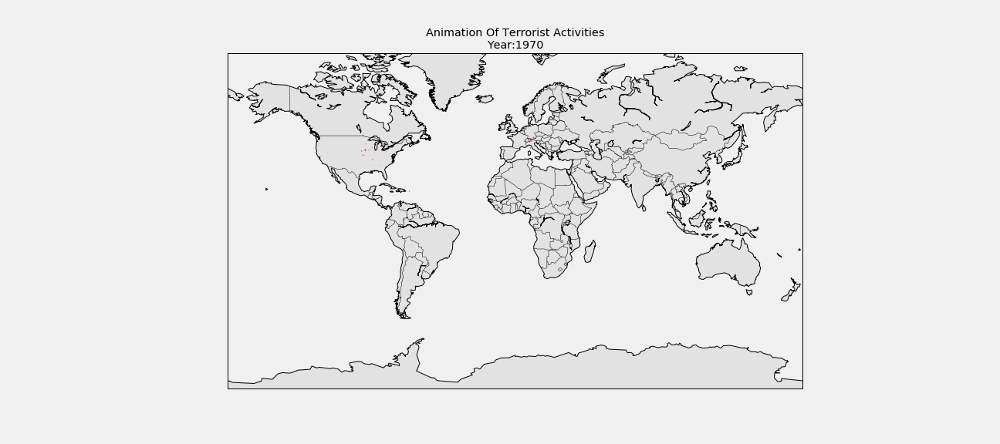

In [17]:
fig = plt.figure(figsize = (18,8))
def animate(Year):
    ax = plt.axes()
    ax.clear()
    ax.set_title('Animation Of Terrorist Activities'+'\n'+'Year:' +str(Year))
    output_ = Basemap(projection='mill',llcrnrlat=-80,urcrnrlat=80, llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')
    lat6=list(df[df['iyear']==Year].latitude)
    long6=list(df[df['iyear']==Year].longitude)
    x6,y6=output_(long6,lat6)
    output_.scatter(x6, y6,s=[(kill+wound)*0.1 for kill,wound in zip(df[df['iyear']==Year].nkill,df[df['iyear']==Year].nwound)],color = 'r')
    output_.drawcoastlines()
    output_.drawcountries()
    output_.fillcontinents(zorder = 1,alpha=0.39)
    output_.drawmapboundary()
ani = animation.FuncAnimation(fig,animate,list(df.iyear.unique()), interval = 1000)    
ani.save('animation.gif', writer='imagemagick', fps=1)
plt.close(1)
filename = 'animation.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

Most of the terrorism attacks are concentrated in the Middle Eastern and Southern Asia region, with growing attacks occuring in Africa over the years.

### Terrorist attacks by year

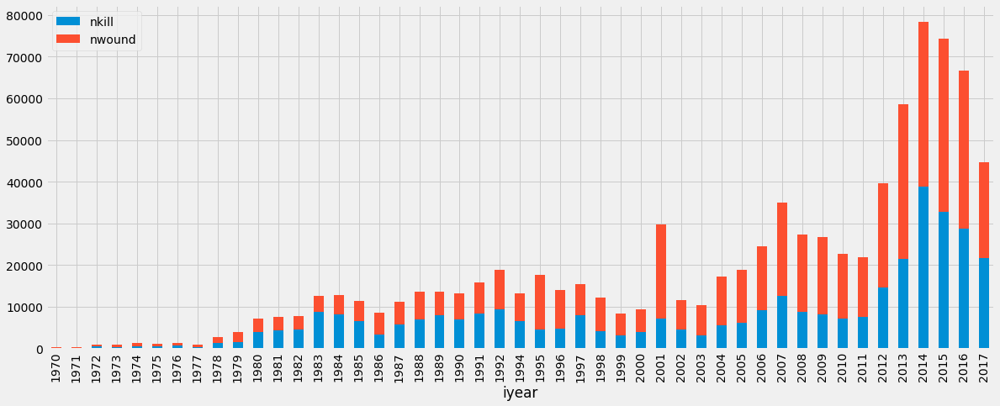

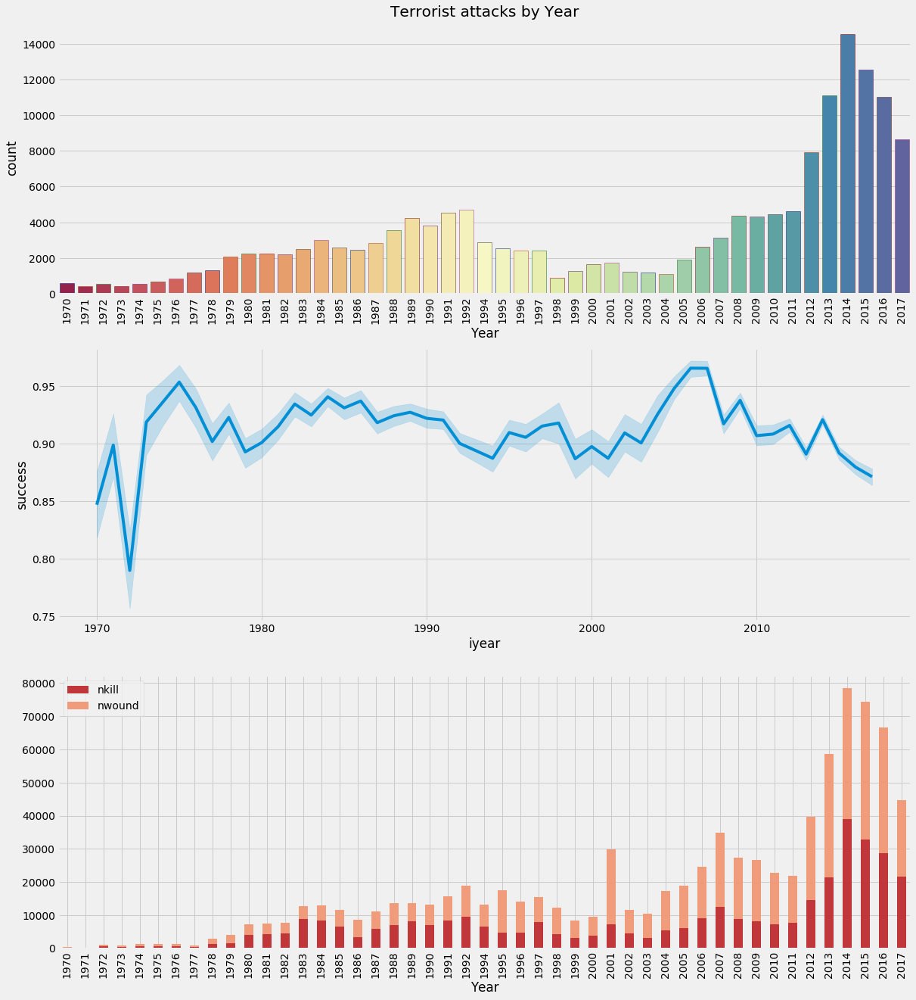

In [292]:
fig1, (ax1,ax2,ax3) = plt.subplots(3,1,figsize=(18,21))
#df.groupby('iyear','success').size()

yc = sns.countplot(x='iyear',data=df,palette='Spectral',edgecolor=sns.color_palette('dark',8),ax=ax1)
yc.set_xticklabels(yc.get_xticklabels(),rotation=90)
yc.set_xlabel('Year')
yc.set_title('Terrorist attacks by Year')
sns.lineplot(x='iyear',y='success',data=df,ax=ax2)
df.groupby('iyear').sum()[['nkill','nwound']].plot(kind='bar',stacked=True,ax=ax3,color=sns.color_palette('RdBu'))
plt.xlabel('Year')
plt.show()

Overall, the number of terrorism attacks increased over the years. There was a drastic spike starting from 2012, reaching its peak in 2014 resulting in casualties of over 70,000 in one single year, and slightly improved in the following years. We could see that the majority of attacks were successful, maintaining at a level of up to a shockingly high 90%. 

In [267]:
# df.groupby(['iyear','success']).size().unstack('success').plot(kind='bar',stacked=True,figsize=(18,10),color=sns.color_palette('dark',8))
# plt.legend(loc='upper left',labels=('failure','success'))
# plt.ylabel('Number of Attacks')
# plt.xlabel('Year')
# plt.title('Attacks by Year')

### Terrorist attacks by region 

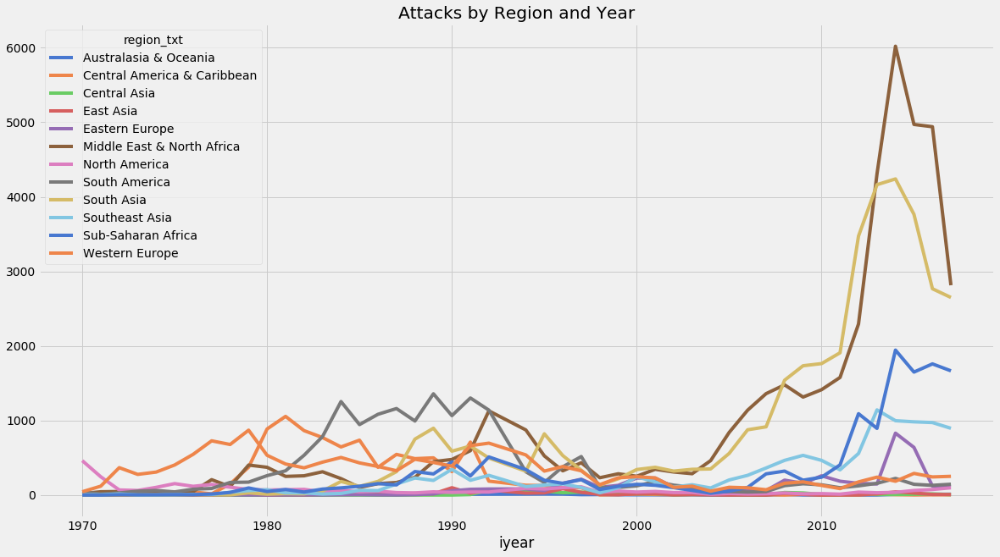

In [273]:
#region vs year
terror_region=pd.crosstab(df.iyear, df.region_txt)
terror_region.plot(color=sns.color_palette('muted'),figsize=(18,10),title='Attacks by Region and Year')


The rise in terrorism attacks that we identified in the 2010s could be largely attributed to the rise of attacks in Middle East and South Asia. But who exactly are behind all these attacks? What are their motives?

## Terrorist attacks by attack type and attack groups

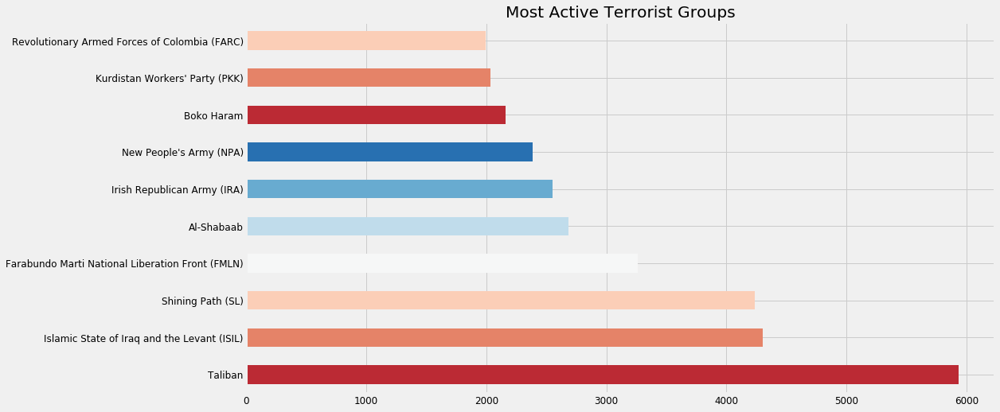

In [74]:
groups=df['gname'].value_counts()[1:11]
groups.plot(kind='barh',figsize=(15,8),fontsize=12,title='Most Active Terrorist Groups',color=sns.color_palette('RdBu',7))


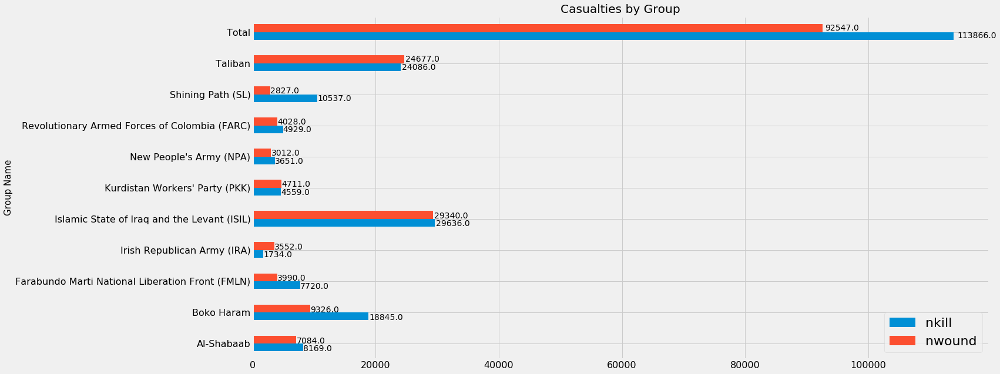

In [69]:
groups=df['gname'].value_counts()[1:11].index
groups=df[df['gname'].isin(groups)]
a= groups.groupby('gname').sum()[['nkill','nwound']]

ax= a.plot(kind='barh',figsize=(20,10),fontsize=16,title='Casualties by Group')

plt.ylabel('Group Name',fontsize=15)
for p in ax.patches:
    ax.annotate(str(p.get_width()), (p.get_width() *1.005, p.get_y()*1.005 ))
ax.legend(loc='lower right',prop={'size':22})


From 1970 to 2017, a total of 92547 died in terrorism attacks, 113,866 injured. The Taliban, Shining Path, and ISIL are the three most active terrorist groups. In particular, Taliban is responsible for almost 6,000 attacks, and the death of over 20,000 people.

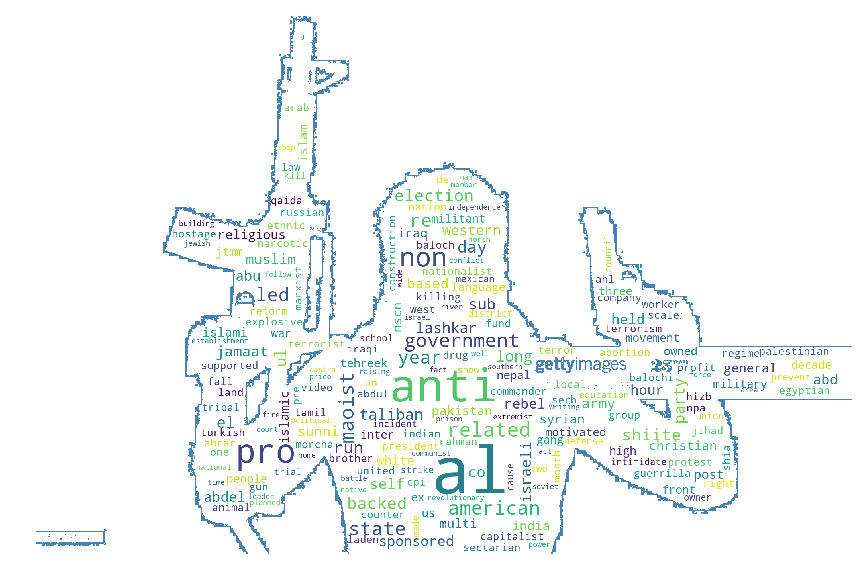

In [33]:
motive=df['motive'].str.lower().str.cat(sep=' ')
words=nltk.tokenize.word_tokenize(motive)
word_dist = nltk.FreqDist(words)
stopwords = nltk.corpus.stopwords.words('english')
words_without_stop = nltk.FreqDist(w for w in words if w not in stopwords) 

origin_mask = imread("terr1.jpg")

wc = WordCloud(stopwords=STOPWORDS,background_color='white',mask=origin_mask, contour_width=3, 
               contour_color='steelblue').generate(" ".join(words_without_stop))
plt.imshow(wc)
fig=plt.gcf()
fig.set_size_inches(15,10)
plt.axis('off')
plt.show()

From the wordcloud it is abvious that the motives of the attacks are religion- or government-related.

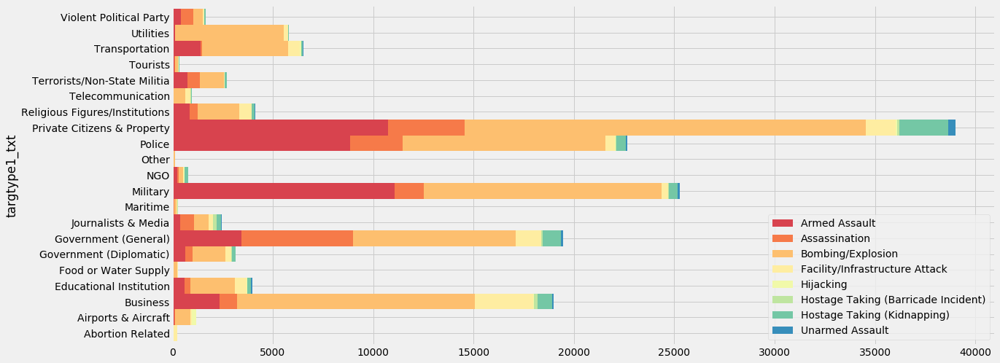

In [136]:
# attack type vs target type
pd.crosstab(df.targtype1_txt,df.attacktype1_txt).plot.barh(stacked=True,width=1,color=sns.color_palette('Spectral',8))
fig=plt.gcf()
fig.set_size_inches(18,8)
plt.legend(loc='lower right')
plt.show()

The most common way of attacking are armed assault and bombing on private properties, police properties and military. 

In [301]:

# fig,ax_c=plt.subplots(2,2,figsize=(15,8))
# df[df['gname']=='Taliban']['country_txt'].value_counts()[1:11].plot(kind='barh',fontsize=12,subplots=True,ax=ax_c[0][0])

# df[df['gname']=='Islamic State of Iraq and the Levant (ISIL)']['country_txt'].value_counts()[1:11].plot(kind='barh',fontsize=12,ax=ax_c[0][1])
# df[df['gname']=='Shining Path (SL)']['country_txt'].value_counts()[1:11].plot(kind='barh',ax=ax_c[1][0])
# df[df['gname']=='Farabundo Marti National Liberation Front (FMLN)']['country_txt'].value_counts()[1:11].plot(kind='barh',ax=ax_c[1][1])


# isil_att['targtype1_txt'].value_counts()
# plt.subplots(figsize=(18,7))
#sns.countplot('country_txt',data=isat,palette='Spectral',edgecolor=sns.color_palette('dark',8))
# plt.xticks(rotation=90)
# plt.title('Terrorist attacks by Year')
# plt.show()

## Most-Attacked Countires

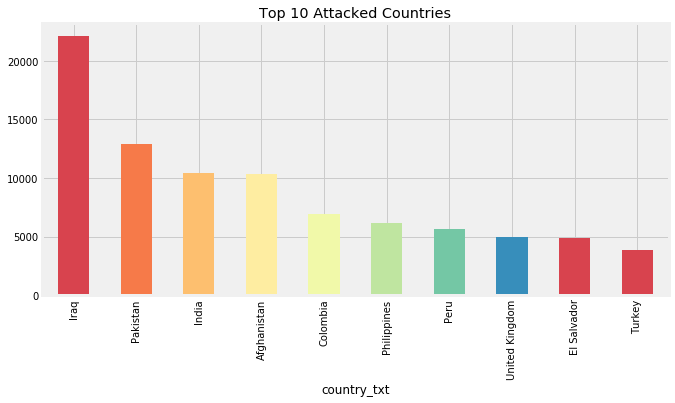

In [70]:
top_c = df.groupby('country_txt')['eventid'].count().sort_values(ascending=False)[:10]
top_c.plot(kind='bar',title='Top 10 Attacked Countries',figsize=(10,5),color=sns.color_palette('Spectral',8))



Over the range of 47 years, Iraq was attacked over 20,000 times in total. Iraq, along with Pakistan, India and Afghanistan are the 4 most attacked countries in the world.

### #1 Iraq

MovieWriter imagemagick unavailable. Trying to use pillow instead.



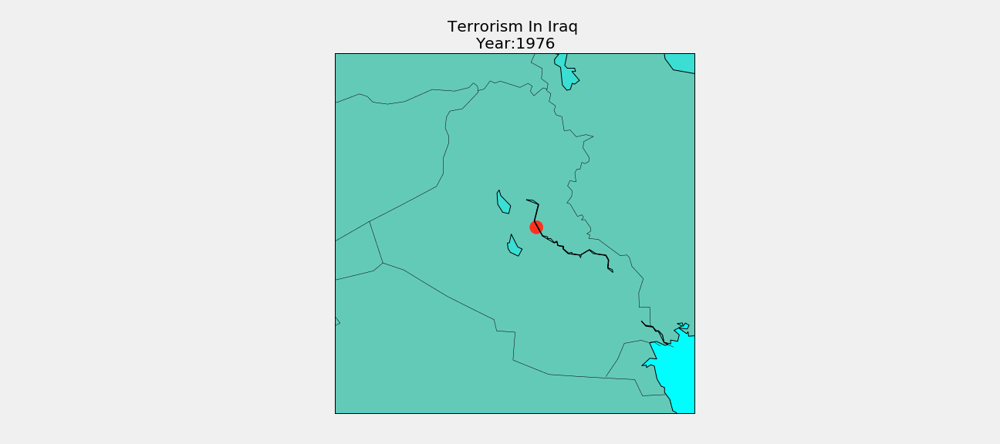

In [16]:
#data in Iraq
terr_ir=df[df['country_txt']=='Iraq']
terr_ir_fol=terr_ir.copy()
terr_ir_fol.dropna(subset=['latitude','longitude'],inplace=True)
location_ind=terr_ir_fol[['latitude','longitude']]
city_ind=terr_ir_fol['city']
killed_ind=terr_ir_fol['nkill']
wound_ind=terr_ir_fol['nwound']
target_ind=terr_ir_fol['targtype1_txt']
fig = plt.figure(figsize = (18,8))
def animate1(Year):
    ax = plt.axes()
    ax.clear()
    ax.set_title('Terrorism In Iraq '+'\n'+'Year:' +str(Year))
    m5 = Basemap(projection='lcc',resolution='l',llcrnrlon=38,llcrnrlat=28,urcrnrlon=50,urcrnrlat=38,lat_0=33.2,lon_0=43.6)
    lat_gif=list(terr_ir[terr_ir['iyear']==Year].latitude)
    long_gif=list(terr_ir[terr_ir['iyear']==Year].longitude)
    x_gif,y_gif=m5(long_gif,lat_gif)
    m5.scatter(x_gif, y_gif,s=[killed+wounded for killed,wounded in zip(terr_ir[terr_ir['iyear']==Year].nkill,terr_ir[terr_ir['iyear']==Year].nwound)],color = 'r')
    m5.drawcoastlines()
    m5.drawcountries()
    m5.fillcontinents(color='coral',lake_color='aqua', zorder = 1,alpha=0.4)
    m5.drawmapboundary(fill_color='aqua')
    
ani = animation.FuncAnimation(fig,animate1,list(terr_ir['iyear'].unique()), interval = 1500)    
ani.save('animation.gif', writer='imagemagick', fps=1)
plt.close(1)
filename = 'animation.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

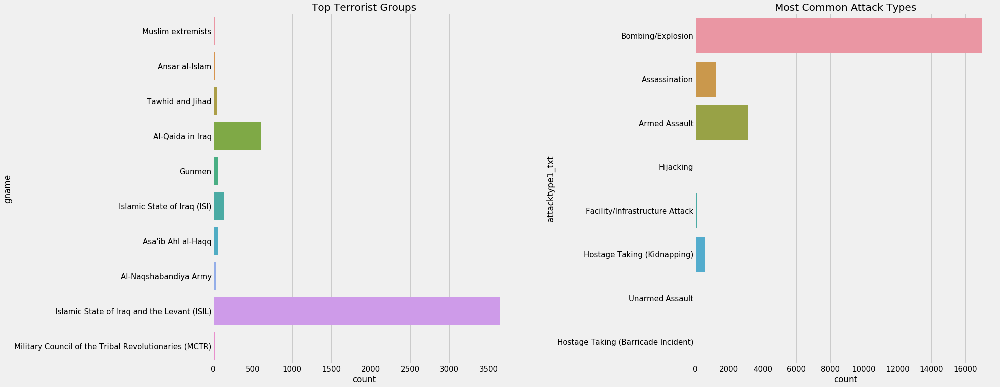

In [135]:
f,ax=plt.subplots(1,2,figsize=(25,12))
terror_iraq=df[df['country_txt']=='Iraq']
iraq_groups=terror_iraq['gname'].value_counts()[1:11].index
iraq_groups=terror_iraq[terror_iraq['gname'].isin(iraq_groups)]
sns.countplot(y='gname',data=iraq_groups,ax=ax[0])
sns.countplot(y='attacktype1_txt',data=terror_iraq,ax=ax[1])
plt.subplots_adjust(hspace=0.3,wspace=0.6)
ax[0].set_title('Top Terrorist Groups')
ax[1].set_title('Most Common Attack Types')
ax[0].tick_params(labelsize=15)
ax[1].tick_params(labelsize=15)
plt.show()


### #2 Pakistan

MovieWriter imagemagick unavailable. Trying to use pillow instead.



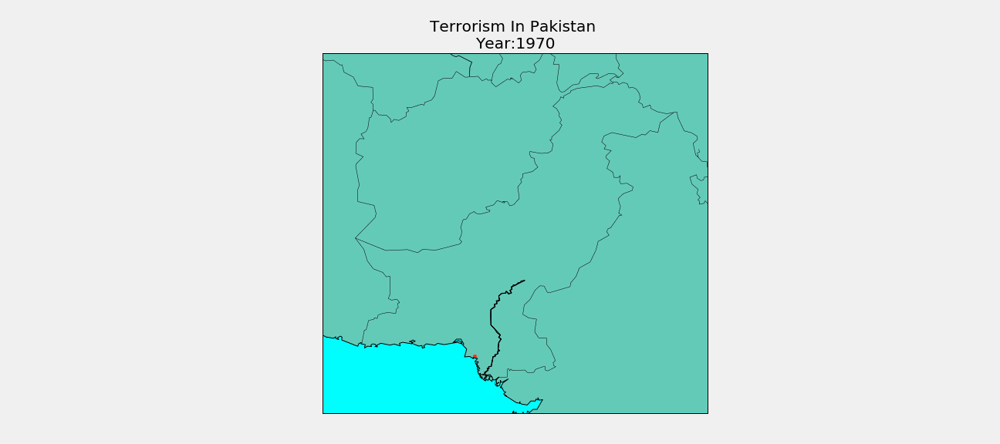

In [17]:
#data in Pakistan
terr_pa=df[df['country_txt']=='Pakistan']
terr_pa_fol=terr_ir.copy()
terr_pa_fol.dropna(subset=['latitude','longitude'],inplace=True)
location_ind=terr_pa_fol[['latitude','longitude']]
city_ind=terr_pa_fol['city']
killed_ind=terr_pa_fol['nkill']
wound_ind=terr_pa_fol['nwound']
target_ind=terr_pa_fol['targtype1_txt']

# how did it spread in india
fig = plt.figure(figsize = (18,8))
def animate1(Year):
    ax = plt.axes()
    ax.clear()
    ax.set_title('Terrorism In Pakistan '+'\n'+'Year:' +str(Year))
    m5 = Basemap(projection='lcc',resolution='l',llcrnrlon=60,llcrnrlat=22,urcrnrlon=80,urcrnrlat=38,lat_0=33.4,lon_0=69.34)
    lat_gif=list(terr_pa[terr_pa['iyear']==Year].latitude)
    long_gif=list(terr_pa[terr_pa['iyear']==Year].longitude)
    x_gif,y_gif=m5(long_gif,lat_gif)
    m5.scatter(x_gif, y_gif,s=[killed+wounded for killed,wounded in zip(terr_pa[terr_pa['iyear']==Year].nkill,terr_pa[terr_pa['iyear']==Year].nwound)],color = 'r')
    m5.drawcoastlines()
    m5.drawcountries()
    m5.fillcontinents(color='coral',lake_color='aqua', zorder = 1,alpha=0.4)
    m5.drawmapboundary(fill_color='aqua')
    
ani = animation.FuncAnimation(fig,animate1,list(terr_pa['iyear'].unique()), interval = 1500)    
ani.save('animation.gif', writer='imagemagick', fps=1)
plt.close(1)
filename = 'animation.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

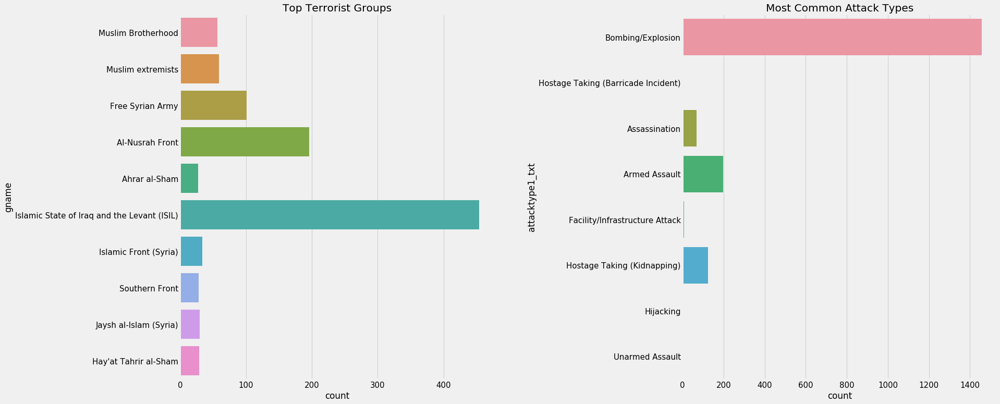

In [137]:
f,ax=plt.subplots(1,2,figsize=(25,12))
terror_syria=df[df['country_txt']=='Syria']
syria_groups=terror_syria['gname'].value_counts()[1:11].index
syria_groups=terror_syria[terror_syria['gname'].isin(syria_groups)]
sns.countplot(y='gname',data=syria_groups,ax=ax[0])
sns.countplot(y='attacktype1_txt',data=terror_syria,ax=ax[1])
plt.subplots_adjust(hspace=0.3,wspace=0.6)
ax[0].set_title('Top Terrorist Groups')
ax[1].set_title('Most Common Attack Types')
ax[0].tick_params(labelsize=15)
ax[1].tick_params(labelsize=15)
plt.show()

### #3 Afghanistan

MovieWriter imagemagick unavailable.



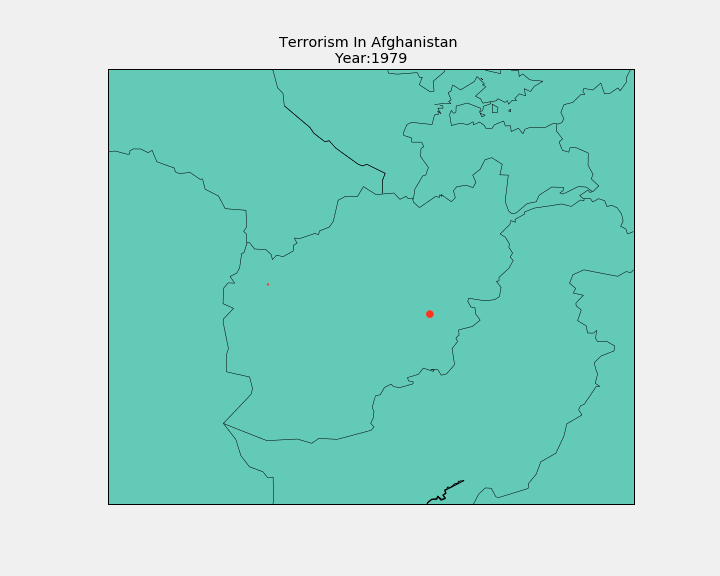

In [13]:
terr_af=df[df['country_txt']=='Afghanistan']
terr_af_fol=terr_af.copy()
terr_af_fol.dropna(subset=['latitude','longitude'],inplace=True)
location_ind=terr_af_fol[['latitude','longitude']]
city_ind=terr_af_fol['city']
killed_ind=terr_af_fol['nkill']
wound_ind=terr_af_fol['nwound']
target_ind=terr_af_fol['targtype1_txt']

fig = plt.figure(figsize = (10,8))
def animate(Year):
    ax = plt.axes()
    ax.clear()
    ax.set_title('Terrorism In Afghanistan '+'\n'+'Year:' +str(Year))
    m5 = Basemap(projection='lcc',resolution='l',llcrnrlon=57,llcrnrlat=27,urcrnrlon=77,urcrnrlat=41,lat_0=35,lon_0=68)
    lat_gif=list(terr_af[terr_af['iyear']==Year].latitude)
    long_gif=list(terr_af[terr_af['iyear']==Year].longitude)
    x_gif,y_gif=m5(long_gif,lat_gif)
    m5.scatter(x_gif, y_gif,s=[killed+wounded for killed,wounded in zip(terr_af[terr_af['iyear']==Year].nkill,terr_af[terr_af['iyear']==Year].nwound)],color = 'r')
    m5.drawcoastlines()
    m5.drawcountries()
    m5.fillcontinents(color='coral',lake_color='aqua', zorder = 1,alpha=0.4)
    m5.drawmapboundary(fill_color='aqua')
    
ani = animation.FuncAnimation(fig,animate,list(terr_af['iyear'].unique()), interval = 1500)    
ani.save('animation-af.gif', writer='imagemagick', fps=1)
plt.close(1)
filename = 'animation-af.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''< img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

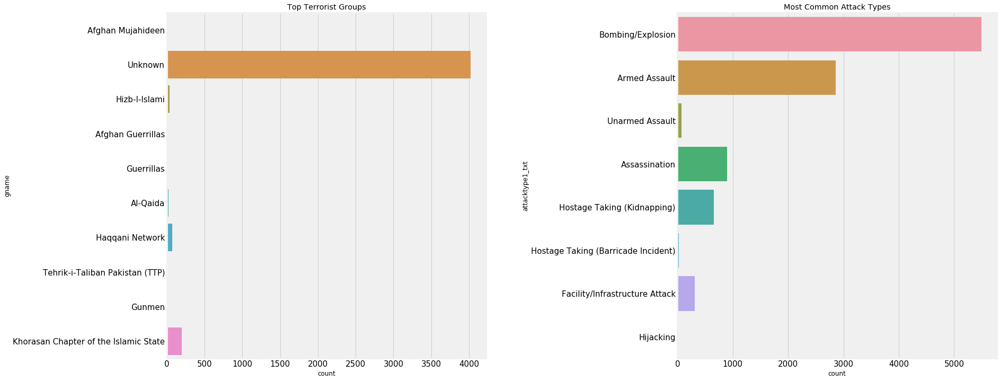

In [26]:
f,ax=plt.subplots(1,2,figsize=(25,12))
terror_afghanistan=df[df['country_txt']=='Afghanistan']
afghanistan_groups=terror_afghanistan['gname'].value_counts()[1:11].index
afghanistan_groups=terror_afghanistan[terror_afghanistan['gname'].isin(afghanistan_groups)]
sns.countplot(y='gname',data=afghanistan_groups,ax=ax[0])
sns.countplot(y='attacktype1_txt',data=terror_afghanistan,ax=ax[1])
plt.subplots_adjust(hspace=0.3,wspace=0.6)
ax[0].set_title('Top Terrorist Groups')
ax[1].set_title('Most Common Attack Types')
ax[0].tick_params(labelsize=15)
ax[1].tick_params(labelsize=15)
plt.show()

### #4 India

MovieWriter imagemagick unavailable. Trying to use pillow instead.



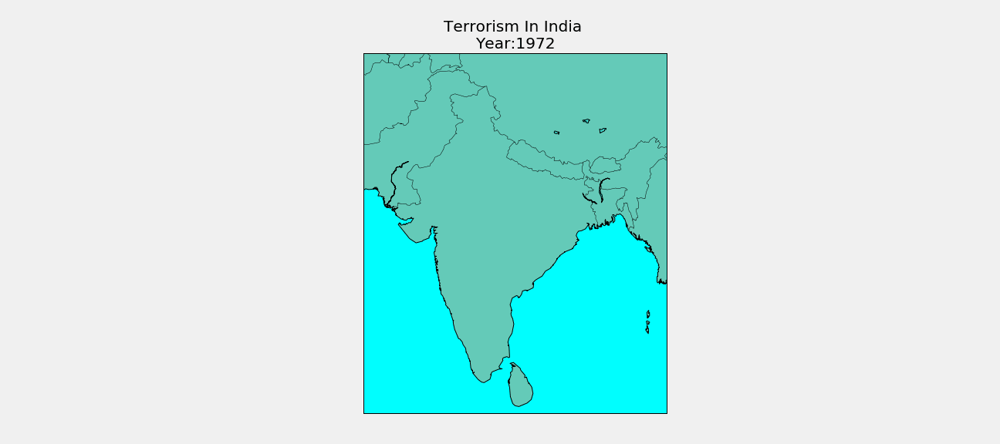

In [19]:
terr_india=df[df['country_txt']=='India']
terr_india_fol=terr_india.copy()
terr_india_fol.dropna(subset=['latitude','longitude'],inplace=True)
location_ind=terr_india_fol[['latitude','longitude']]
city_ind=terr_india_fol['city']
killed_ind=terr_india_fol['nkill']
wound_ind=terr_india_fol['nwound']
target_ind=terr_india_fol['targtype1_txt']

fig = plt.figure(figsize = (18,8))
def animate(Year):
    ax = plt.axes()
    ax.clear()
    ax.set_title('Terrorism In India '+'\n'+'Year:' +str(Year))
    m5 = Basemap(projection='lcc',resolution='l',llcrnrlon=67,llcrnrlat=5,urcrnrlon=99,urcrnrlat=37,lat_0=28,lon_0=77)
    lat_gif=list(terr_india[terr_india['iyear']==Year].latitude)
    long_gif=list(terr_india[terr_india['iyear']==Year].longitude)
    x_gif,y_gif=m5(long_gif,lat_gif)
    m5.scatter(x_gif, y_gif,s=[killed+wounded for killed,wounded in zip(terr_india[terr_india['iyear']==Year].nkill,terr_india[terr_india['iyear']==Year].nwound)],color = 'r')
    m5.drawcoastlines()
    m5.drawcountries()
    m5.fillcontinents(color='coral',lake_color='aqua', zorder = 1,alpha=0.4)
    m5.drawmapboundary(fill_color='aqua')
    
ani = animation.FuncAnimation(fig,animate,list(terr_india['iyear'].unique()), interval = 1500)    
ani.save('animation.gif', writer='imagemagick', fps=1)
plt.close(1)
filename = 'animation.gif'
video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

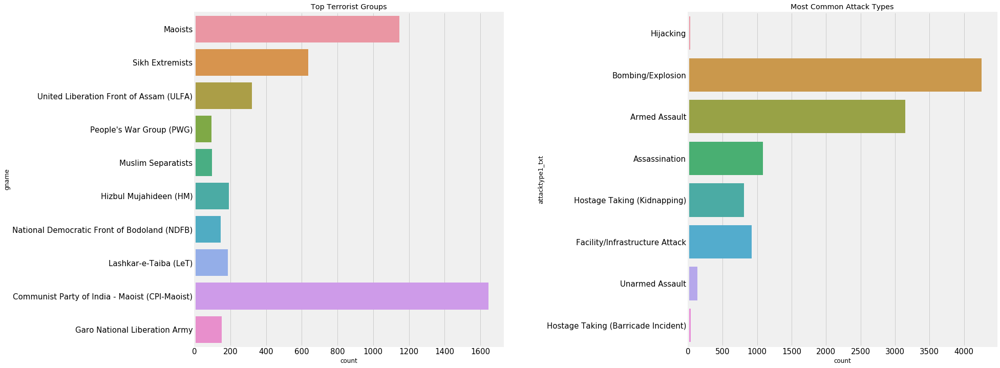

In [27]:
f,ax=plt.subplots(1,2,figsize=(25,12))
terror_india=df[df['country_txt']=='India']
india_groups=terror_india['gname'].value_counts()[1:11].index
india_groups=terror_india[terror_india['gname'].isin(india_groups)]
sns.countplot(y='gname',data=india_groups,ax=ax[0])
sns.countplot(y='attacktype1_txt',data=terror_india,ax=ax[1])
plt.subplots_adjust(hspace=0.3,wspace=0.6)
ax[0].set_title('Top Terrorist Groups')
ax[1].set_title('Most Common Attack Types')
ax[0].tick_params(labelsize=15)
ax[1].tick_params(labelsize=15)
plt.show()

## Terrorism over United States

In [14]:
target_codes = []
df_us = df[(df.country_txt == 'United States') & (df.provstate != 'Puerto Rico')]
for attack in df_us['targtype1_txt'].values:
    if attack in ['Business', 'Journalists & Media', 'NGO']:
        target_codes.append(1)
    elif attack in ['Government (General)', 'Government (Diplomatic)']:
        target_codes.append(2)
    elif attack == 'Abortion Related':
        target_codes.append(4)
    elif attack == 'Educational Institution':
        target_codes.append(5)
    elif attack == 'Police':
        target_codes.append(6)
    elif attack == 'Military':
        target_codes.append(7)
    elif attack == 'Religious Figures/Institutions':
        target_codes.append(8)
    elif attack in ['Airports & Aircraft', 'Maritime', 'Transportation']:
        target_codes.append(9)
    elif attack in ['Food or Water Supply', 'Telecommunication', 'Utilities']:
        target_codes.append(10)
    else:
        target_codes.append(3)

In [15]:
plt.figure(figsize=(8,8))
df_us['targtype1_txt'] = target_codes
target_categories = ['Business', 'Government', 'Individuals', 'Healthcare', 'Education',
                     'Police', 'Military', 'Religion', 'Transportation', 'Infrastructure']


target_count = np.asarray(df_us.groupby('targtype1_txt').targtype1_txt.count())
target_percent = np.round(target_count / sum(target_count) * 100, 2)


target_fatality = np.asarray(df_us.groupby('targtype1_txt')['nkill'].sum())
target_yaxis = np.asarray([1.34, 2.37, 2.99, 0.82, 1.26, 1.72, 1.32, 1.54, 1.35, 0])


# terrorist attack injuries by target
target_injury = np.asarray(df_us.groupby('targtype1_txt')['nwound'].sum())
target_xaxis = np.log10(target_injury)

target_text = []
for i in range(0, 10):
    target_text.append(target_categories[i] + ' (' + target_percent[i].astype(str) 
                       + '%)<br>' + target_fatality[i].astype(str) + ' Killed, '
                       + target_injury[i].astype(str) + ' Injured')

data = [go.Scatter(
        x = target_injury,
        y = target_fatality,
        text = target_text,
        mode = 'markers',
        hoverinfo = 'text',
        marker = dict(
            size = target_count / 5,
            opacity = 1,
            color = 'rgb(240, 140, 45)')
        )]


layout = go.Layout(
         title = 'Terrorist Attacks by Target in the United States (1970-2017)',
         xaxis = dict(
             title = 'number of wounds',
             type = 'log',
             range = [1.36, 3.26],
             tickmode = 'auto',
             nticks = 2,
             showline = True,
             showgrid = False
         ),
         yaxis = dict(
             title = 'number of kills',
             type = 'log',
             range = [0.59, 3.45],
             tickmode = 'auto',
             nticks = 4,
             showline = True,
             showgrid = False)
         )


figure = dict(data = data, layout = layout)

py.iplot(figure)

<Figure size 576x576 with 0 Axes>

# Prediction Model

we used logistic regression, random forest and svm for 'success' prediction.

'success' is a binary variable, if the terrorist attack succeeded, success=1, otherwise success=0.

## Verify Correlation Matrix

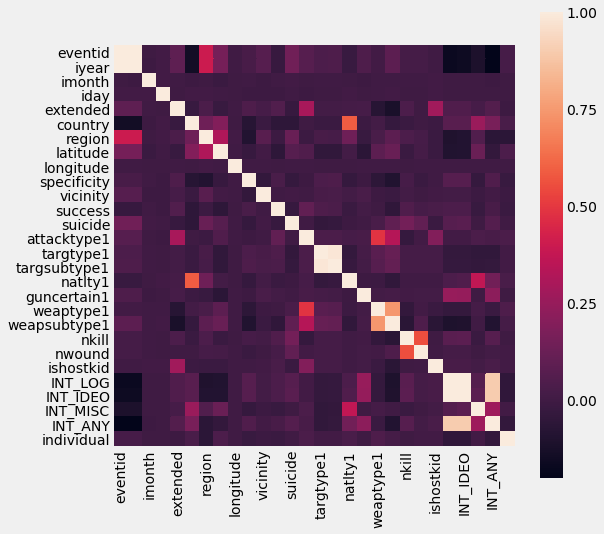

In [34]:
corrmat = df.corr()
f, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(corrmat, vmax=1, square=True)

## Logistic Regression 

In [35]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.svm import SVC

In [36]:
# drop null records
df = df.drop(['motive'],axis=1)
df = df.dropna(axis=0,how='any')

X = df[['country','region','attacktype1','individual','suicide','weaptype1','targtype1','guncertain1']]
y = df['success']

# split data set
X_tv, X_test, y_tv, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
X_val, X_train, y_val, y_train = train_test_split(X_tv,y_tv,test_size=0.2)

logreg = LogisticRegression(solver='lbfgs',multi_class='multinomial')
logreg.fit(X_train, y_train)


print('MSE on training set:', mean_squared_error(logreg.predict(X_train),y_train))
print('MSE on validation set:',mean_squared_error(logreg.predict(X_val),y_val))

MSE on training set: 0.1001122229495932
MSE on validation set: 0.09687752072105774


In [37]:
y_pred = logreg.predict(X_test)
cfm = confusion_matrix(y_test, y_pred)
cfm
print(classification_report(y_test, y_pred))

             precision    recall  f1-score   support

          0       0.26      0.00      0.01      2678
          1       0.90      1.00      0.95     24054

avg / total       0.84      0.90      0.85     26732



## Random Forest

### Ensemble Random Forest Model

In [38]:
parameters = {
     'n_estimators':(5,10,15), #the number of trees
     'max_depth':(4,6,8,10),
     'min_samples_split': (4,6,8),
     'min_samples_leaf': (4,8,12,16),
}

RFC = GridSearchCV(RandomForestClassifier(),parameters,cv=3,iid=False)
RFC.fit(X_train, y_train)
par = RFC.best_params_
print('Parameters:',par)

Parameters: {'max_depth': 8, 'min_samples_leaf': 4, 'min_samples_split': 4, 'n_estimators': 15}


In [39]:
best_RFC = RandomForestClassifier(max_depth=par['max_depth'],min_samples_leaf=par['min_samples_split'],
                             min_samples_split=par['min_samples_split'],n_estimators=par['n_estimators'])
best_RFC.fit(X_train, y_train)

print('MSE on training set:', mean_squared_error(best_RFC.predict(X_train),y_train))
print('MSE on validation set:',mean_squared_error(best_RFC.predict(X_val),y_val))

MSE on training set: 0.09188253997942579
MSE on validation set: 0.09197928478741188


In [40]:
y_pred = best_RFC.predict(X_test)
cfm = confusion_matrix(y_test, y_pred)
print(classification_report(y_test, y_pred))

             precision    recall  f1-score   support

          0       0.69      0.09      0.16      2678
          1       0.91      1.00      0.95     24054

avg / total       0.89      0.90      0.87     26732



### feature importance

Text(0.5, 0, 'Relative Importance')

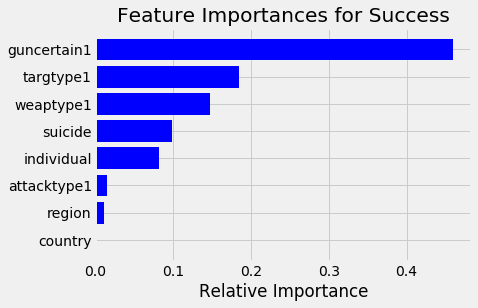

In [41]:
feature_names = [i for i in X.columns]
importances = best_RFC.feature_importances_
indices = np.argsort(importances)

plt.title('Feature Importances for Success')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)),feature_names)
plt.xlabel('Relative Importance')

## SVM

In [42]:
clf = SVC(kernel='rbf',C=0.4)
clf.fit(X_train,y_train)

print('MSE on training set:', mean_squared_error(clf.predict(X_train),y_train))
print('MSE on validation set:',mean_squared_error(clf.predict(X_val),y_val))

MSE on training set: 0.09646497708781446
MSE on validation set: 0.09404846798611192


In [43]:
y_pred = clf.predict(X_test)
cfm = confusion_matrix(y_test, y_pred)
print(classification_report(y_test, y_pred))

             precision    recall  f1-score   support

          0       0.64      0.05      0.09      2678
          1       0.90      1.00      0.95     24054

avg / total       0.88      0.90      0.86     26732



## Model selection

- Logistic Regression: MSE on validation set is 0.09687752072105774
- Random Forest: MSE on validation set is 0.09197928478741188
- SVM MSE on validation set is 0.09404846798611192

Therefore we choose Random Forest for prediction.

In [44]:
final_X_train = pd.concat([X_train,X_val])
final_y_train = pd.concat([y_train,y_val])
best_RFC.fit(final_X_train,final_y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=8, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=4, min_samples_split=4,
            min_weight_fraction_leaf=0.0, n_estimators=15, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [45]:
y_pred = best_RFC.predict(X_test)
cfm = confusion_matrix(y_test, y_pred)
print(classification_report(y_test, y_pred))

             precision    recall  f1-score   support

          0       0.70      0.11      0.19      2678
          1       0.91      0.99      0.95     24054

avg / total       0.89      0.91      0.87     26732

